$$\textbf{u}=-\frac{\textbf{k}}{\mu}(\nabla p - \rho g)$$

$$\phi \frac{\partial p}{\partial t} - \frac{1}{\mu} \nabla \cdot (\textbf{k} \nabla p) = q$$




In [24]:
from mpi4py import MPI
from dolfinx import mesh
import ufl
import numpy as np
from dolfinx import fem

class BoundaryCondition():
    def __init__(self, type, marker, values,facet_tag, functionspace,fdim,ds=None):
        self._type = type
        if type == "Dirichlet":
            if callable(values):
                u_D = fem.Function(functionspace)
                u_D.interpolate(values)
                facets = facet_tag.find(marker)
                dofs = fem.locate_dofs_topological(functionspace, fdim, facets)
                self._bc = fem.dirichletbc(u_D, dofs)
            else:
                facets = facet_tag.find(marker)
                dofs = fem.locate_dofs_topological(functionspace, fdim, facets)
                self._bc = fem.dirichletbc(values, dofs,functionspace) #wall_dofs, V)
        elif type == "Neumann":
                self._bc = ufl.inner(values, v) * ds(marker)
        elif type == "Robin":
            self._bc = values[0] * ufl.inner(u-values[1], v)* ds(marker)
        else:
            raise TypeError("Unknown boundary condition: {0:s}".format(type))
    @property
    def bc(self):
        return self._bc

    @property
    def type(self):
        return self._type
    



In [25]:
import numpy as np
from dolfinx import fem
from dolfinx import mesh
import ufl
from mpi4py import MPI
from petsc4py import PETSc

from basix.ufl import element



In [26]:
domain = mesh.create_unit_square(MPI.COMM_WORLD, 20, 20)

tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(fdim, tdim)

x = ufl.SpatialCoordinate(domain)

t = 0
T = 10
num_steps = 1000

dt = T / num_steps

def K(x):
    return 1.0/(ufl.exp(-(((x[1] - 0.5 - 0.1*ufl.sin(10*x[0]))/0.1)*((x[1] - 0.5 - 0.1*ufl.sin(10*x[0]))/0.1))) + 1.0)
    #return 0.5*ufl.exp(-1*((x[0]-0.5)**2+(x[1]-0.5)**2)/0.1)
    #return 0.1

n = ufl.FacetNormal(domain)
q = fem.Constant(domain, PETSc.ScalarType(0))
dt_ = fem.Constant(domain, PETSc.ScalarType(dt))
mu = fem.Constant(domain, PETSc.ScalarType(0.3))
phi = fem.Constant(domain, PETSc.ScalarType(0.5))

#Elements
s_cg1 = element("Lagrange", domain.topology.cell_name(), 1)
P = fem.functionspace(domain, s_cg1)

p = ufl.TrialFunction(P)
v = ufl.TestFunction(P)

#Boundaries
boundaries=[
    (1, lambda x: np.isclose(x[0],0)), # x=0
    (2, lambda x: np.isclose(x[0],1)), # x=1
    (3, lambda x: np.isclose(x[1],0)), # y=0
    (4, lambda x: np.isclose(x[1],1)) # y=1
]

facet_indices,facet_markers=[],[]
for (marker, locator) in boundaries:
    facets= mesh.locate_entities(domain,fdim,locator)
    facet_indices.append(facets)
    facet_markers.append(np.full_like(facets,marker))
facet_indices=np.hstack(facet_indices).astype(np.int32)
facet_markers=np.hstack(facet_markers).astype(np.int32)
sorted_facets=np.argsort(facet_indices)
facet_tag=mesh.meshtags(domain,fdim,facet_indices[sorted_facets],facet_markers[sorted_facets])


#x_ufl = 1 + x[0] + 2 * x[1]

#h = - ufl.div(K(x_ufl) * ufl.grad(x_ufl))


#pressure_boundary_conditions=[
#    BoundaryCondition("Dirichlet", 1, PETSc.ScalarType(0.0),facet_tag,P,fdim)._bc,
#    BoundaryCondition("Dirichlet", 2, PETSc.ScalarType(0.0),facet_tag,P,fdim)._bc,
#    BoundaryCondition("Dirichlet", 3, PETSc.ScalarType(0.1),facet_tag,P,fdim)._bc,
#    BoundaryCondition("Dirichlet", 4, PETSc.ScalarType(0.7),facet_tag,P,fdim)._bc
#                      ]

pressure_boundary_conditions=[
    BoundaryCondition("Dirichlet", 1, (lambda x: 1-x[0]),facet_tag,P,fdim)._bc,
    BoundaryCondition("Dirichlet", 2, (lambda x: 1-x[0]),facet_tag,P,fdim)._bc,
    BoundaryCondition("Dirichlet", 3, (lambda x: 1-x[0]),facet_tag,P,fdim)._bc,
    BoundaryCondition("Dirichlet", 4, (lambda x: 1-x[0]),facet_tag,P,fdim)._bc
                      ]

## Discretization in time

$$\frac{\partial p}{\partial t} \approx \left ( \frac{p^{n+1}-p^{n}}{\Delta t} \right )$$

$$\left ( \frac{p^{n+1}-p^{n}}{\Delta t} \right ) = q + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p)$$

$$ p^{n+1} = p^{n} + \Delta t \left ( q + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p) \right )$$

## For Prediction Correction scheme

### Predictor:

$$\left ( \frac{p^{*}-p^{n}}{\Delta t} \right ) = q + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^n)$$
$$ p^{*} = p^{n} + \Delta t \left ( q^n + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^n) \right )$$

#### Solve for $p^*$, apply inner product:

$$\left \langle \frac{p^{*}-p^{n}}{\Delta t} ,v \right \rangle_{\Omega} = \langle q,v \rangle_{\Omega} + \left \langle \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^n) \right \rangle_{\Omega} $$

#### Solve for $p^{n+1}$, apply inner product:

### Corrector

$$\left ( \frac{p^{n+1}-p^{n}}{\Delta t} \right ) =\frac{1}{2} \left [
    (q^{n} + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^{n})bla \cdot (\textbf{k} \nabla p^{*})) 
    \right ]$$

$$ p^{n+1} = p^{n} + \frac{\Delta t}{2} \left [
    (q^{n} + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^{n})) +
    (q^{n+1} + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^{*})) 
    \right ]$$

#### Solve for $p^{n+1}$, apply inner product:

$$\left \langle \frac{2(p^{n+1}-p^{n})}{\Delta t} , v \right \rangle_{\Omega}  = 
\left \langle
    \left ( q^{n} + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^{n}) \right ) +
    \left ( q^{n+1} + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p^{*}) \right ) 
    , v \right \rangle_{\Omega} 
    $$

## Basic euler time discretization

$$\left ( \frac{p^{n+1}-p^{n}}{\Delta t} \right ) = q + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p)$$

$$\left ( p^{n+1}-p^{n} \right ) = \Delta t q + \frac{\Delta t}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p)$$

#### Solve for $p^{n+1}$, apply inner product:

$$\left \langle \frac{p^{n+1}-p^{n}}{\Delta t} , v \right \rangle_{\Omega} = \left \langle q + \frac{1}{\phi\mu} \nabla \cdot (\textbf{k} \nabla p) , v \right \rangle_{\Omega} $$


$$
\left \langle \left ( p^{n+1}-p^{n} \right ) , v \right \rangle_{\Omega} = 
\Delta t \left \langle  q ,v \right \rangle_{\Omega} + 
\frac{\Delta t}{\phi\mu} \textbf{k}(\textbf{x}) \left \langle \nabla p, \nabla v \right \rangle_{\Omega} -
\Delta t \left \langle \nabla (\textbf{k}(\textbf{x}) \nabla p) , v \right \rangle_{\partial \Omega} 
$$

$$
\left \langle \left ( p^{n+1}-p^{n} \right ) , v \right \rangle_{\Omega} 
- \frac{\Delta t}{\phi\mu} \textbf{k}(\textbf{x}) \left \langle \nabla p, \nabla v \right \rangle_{\Omega}
= \Delta t \left \langle  q ,v \right \rangle_{\Omega} 
 - \Delta t \left \langle (\textbf{k}(\textbf{x}) \nabla p) , v \right \rangle_{\partial \Omega} 
$$

In [27]:
import dolfinx.fem.petsc

def initial_condition(x):
    #return np.array([0.1])
    return np.array([0.1])+x[0]*np.array([0.7])

# Define the variational problem for the first step
p_n = dolfinx.fem.Function(P)
p_n.name = "p_n"
p_n.interpolate(initial_condition)

ph = dolfinx.fem.Function(P)
ph.name = "ph"
ph.interpolate(initial_condition)

F1 = ufl.dot((p - p_n), v) * ufl.dx
F1 -= (dt_ / (phi*mu)) * K(x) * ufl.dot(ufl.grad(p), ufl.grad(v)) * ufl.dx
F1 -= dt_ *ufl.inner(q,v) * ufl.dx
#F1 -= dt_ * ufl.inner(h,v) * ufl.dx
#F1 += ufl.dot(p_n * n, v) * ufl.ds - ufl.dot(mu * ufl.nabla_grad(U) * n, v) * ufl.ds

a1 = fem.form(ufl.lhs(F1))
L1 = fem.form(ufl.rhs(F1))
import dolfinx.fem.petsc
A1 = fem.petsc.assemble_matrix(a1, bcs=pressure_boundary_conditions)
A1.assemble()
b1 = fem.petsc.create_vector(L1)

In [28]:
# Solver for step 1
solver1 = PETSc.KSP().create(domain.comm)
solver1.setOperators(A1)
solver1.setType(PETSc.KSP.Type.BCGS)
pc1 = solver1.getPC()
pc1.setType(PETSc.PC.Type.HYPRE)
pc1.setHYPREType("boomeramg")


In [29]:
from dolfinx.io import VTXWriter
from pathlib import Path
folder = Path("results")
folder.mkdir(exist_ok=True, parents=True)
#vtx_u = VTXWriter(domain.comm, folder / "poiseuille_u.bp", u_n, engine="BP4")
vtx_p = VTXWriter(domain.comm, folder / "darcy_fluid_p.bp", p_n, engine="BP4")
vtx_p.write(t)

In [30]:
def u_exact(x):
    values = np.zeros((2, x.shape[1]), dtype=PETSc.ScalarType)
    values[0] = 4 * x[1] * (1.0 - x[1])
    return values


u_ex = fem.Function(V)
u_ex.interpolate(u_exact)

L2_error = fem.form(ufl.dot(u_ - u_ex, u_ - u_ex) * ufl.dx)

NameError: name 'V' is not defined

In [31]:
! apt install -y libgl1-mesa-glx xvfb
#! pip3 install pyvista


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgl1-mesa-glx is already the newest version (23.0.4-0ubuntu1~22.04.1).
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.14).
0 upgraded, 0 newly installed, 0 to remove and 57 not upgraded.


In [32]:
import pyvista
from dolfinx import plot
import matplotlib as mpl
pyvista.start_xvfb()

grid = pyvista.UnstructuredGrid(*plot.vtk_mesh(P))

plotter = pyvista.Plotter()
plotter.open_gif("u_time.gif", fps=10)

grid.point_data["ph"] = ph.x.array
#warped = grid.warp_by_scalar("ph", factor=1)

viridis = mpl.colormaps.get_cmap("viridis").resampled(25)
sargs = dict(title_font_size=25, label_font_size=20, fmt="%.2e", color="black",
             position_x=0.1, position_y=0.8, width=0.8, height=0.01)

renderer = plotter.add_mesh(grid, show_edges=True, lighting=False,
                            cmap=viridis, scalar_bar_args=sargs,
                            clim=[0, max(ph.x.array)])

Time 0.01


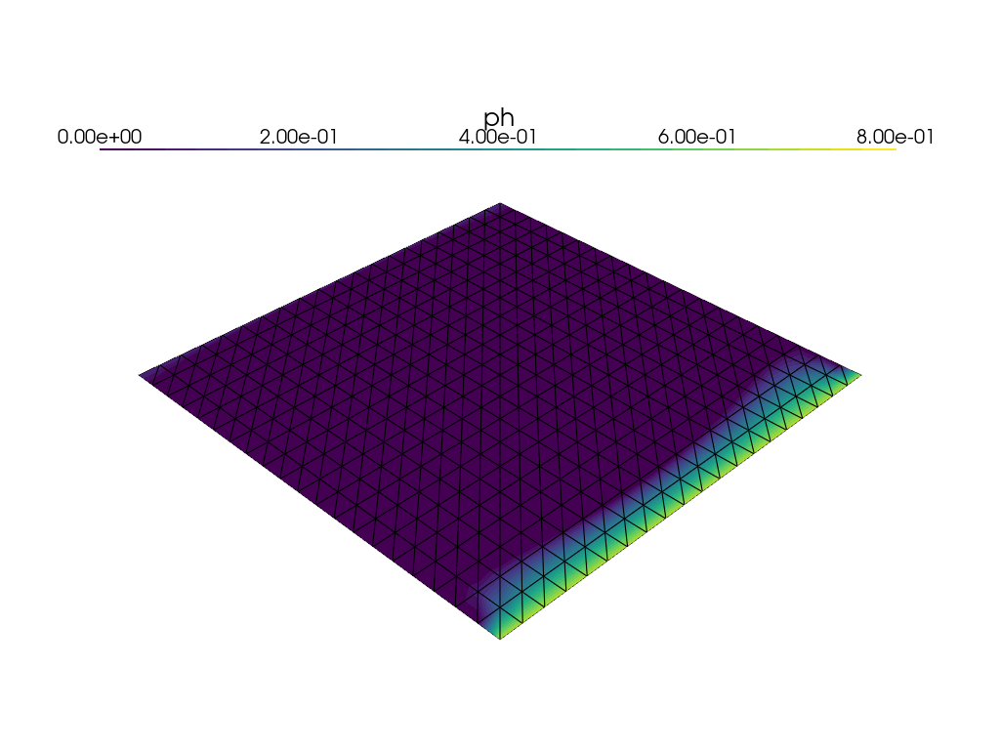

Time 0.06


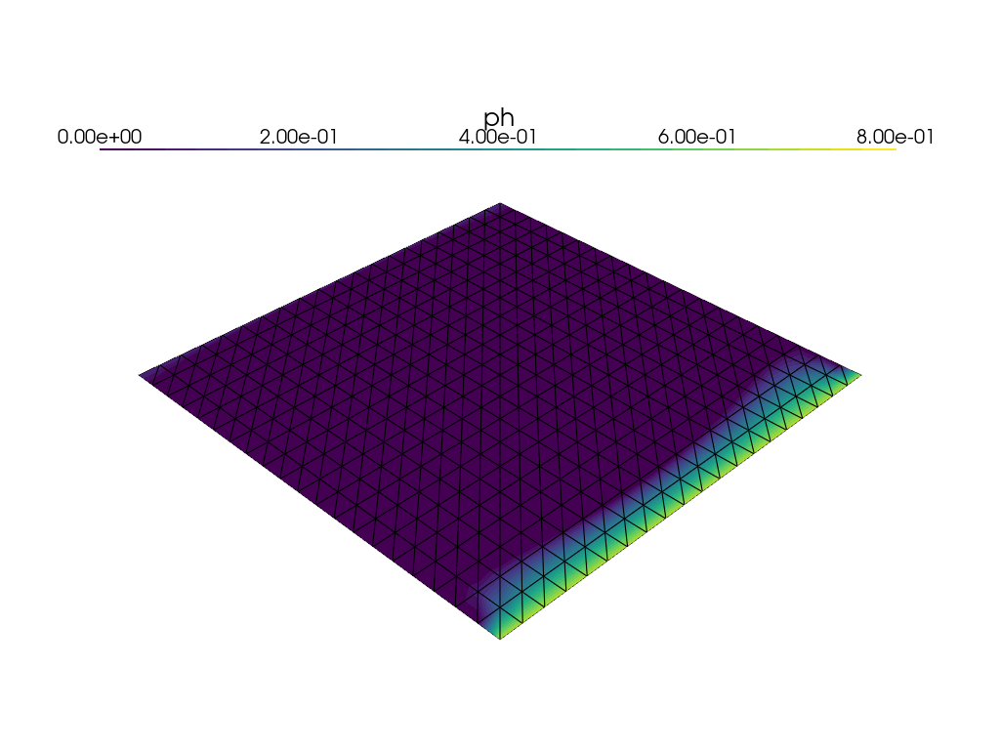

Time 0.11


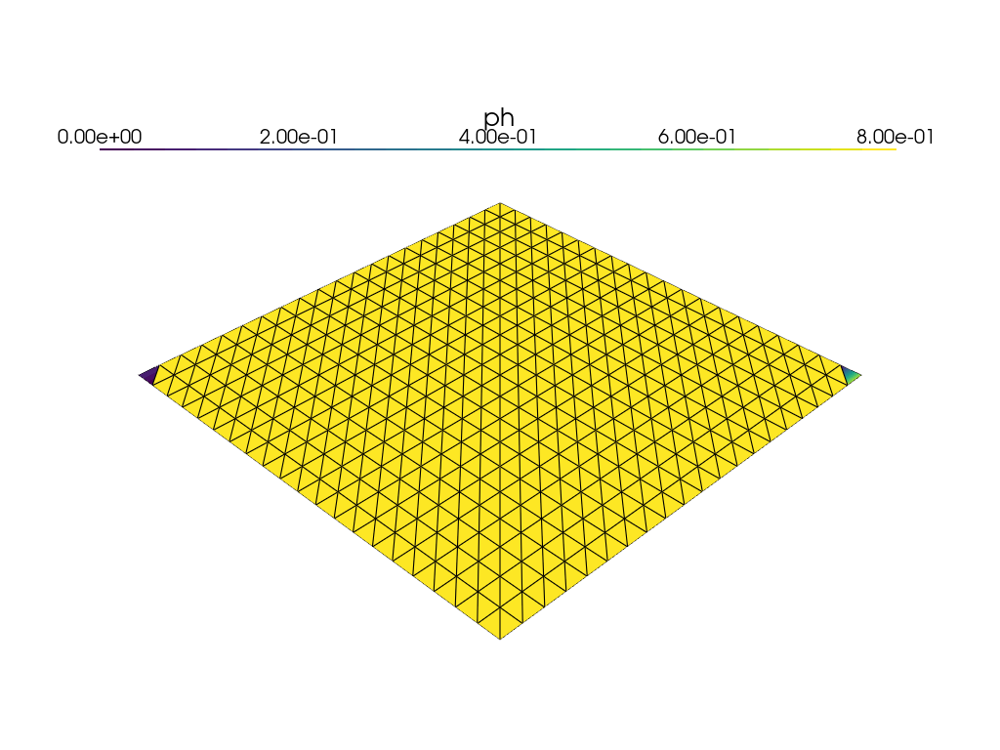

Time 0.16


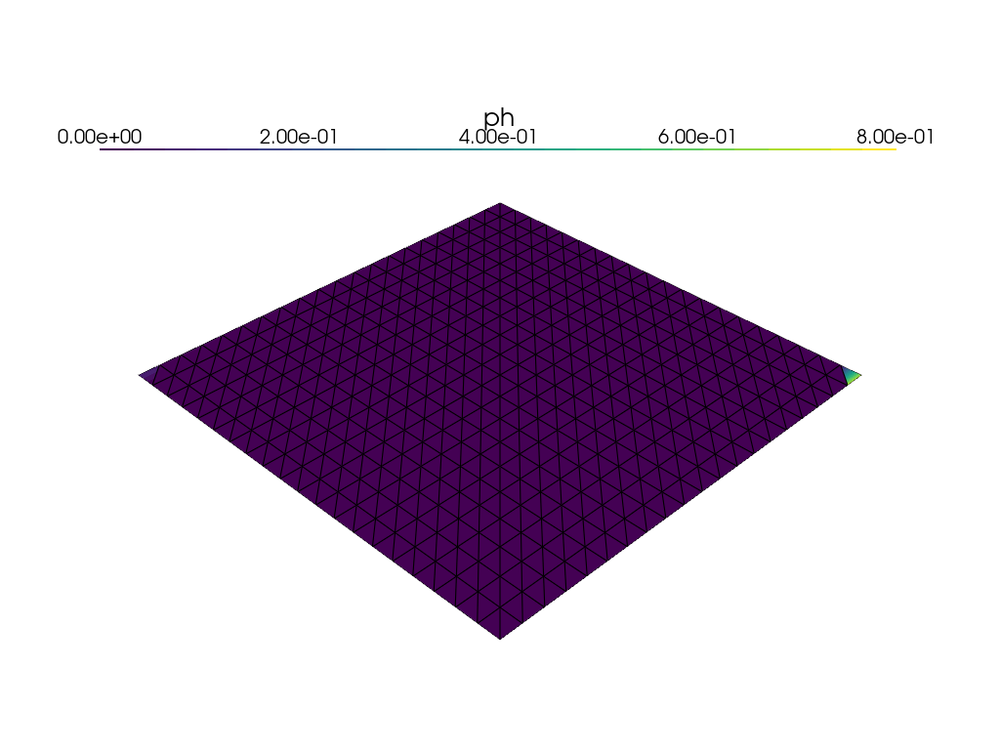

Time 0.21


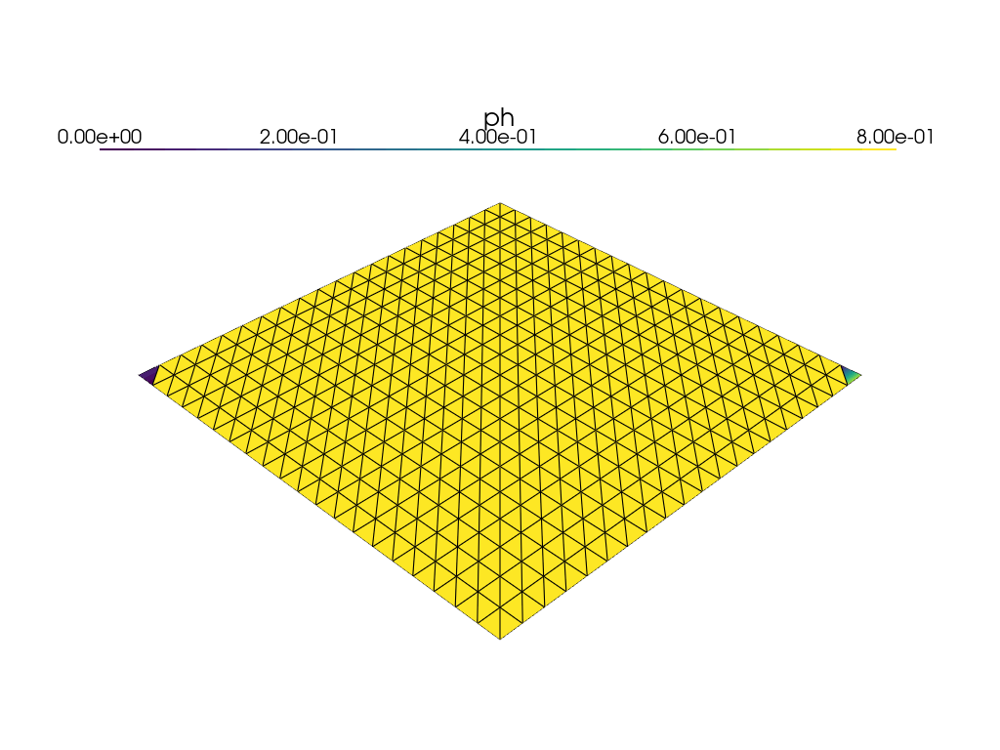

Time 0.26


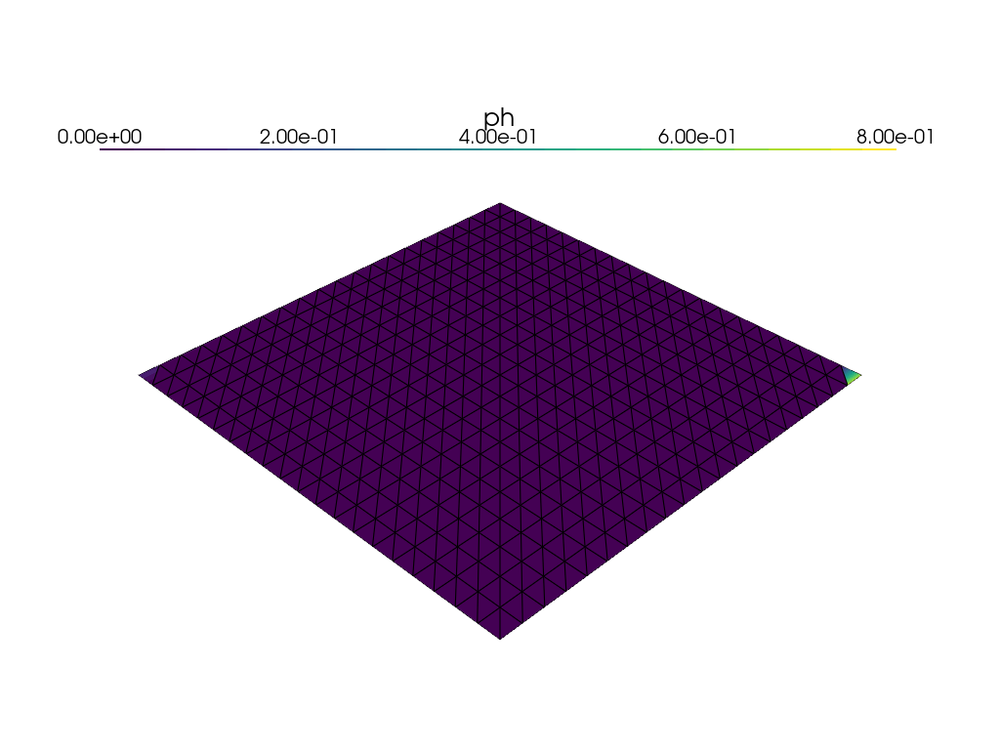

Time 0.31


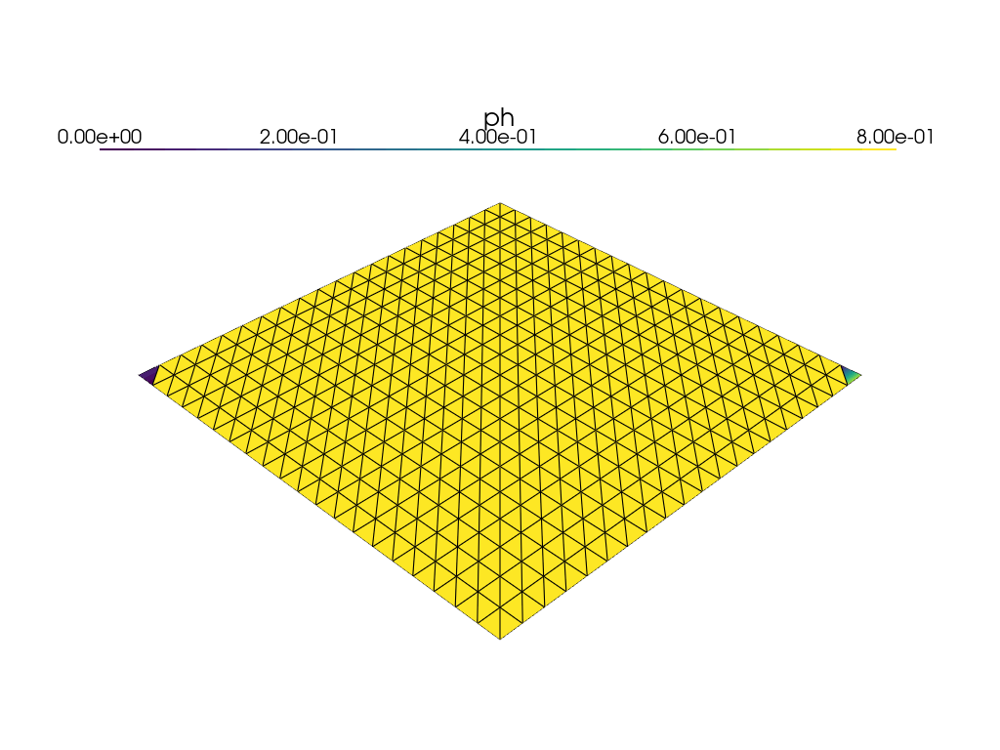

Time 0.36


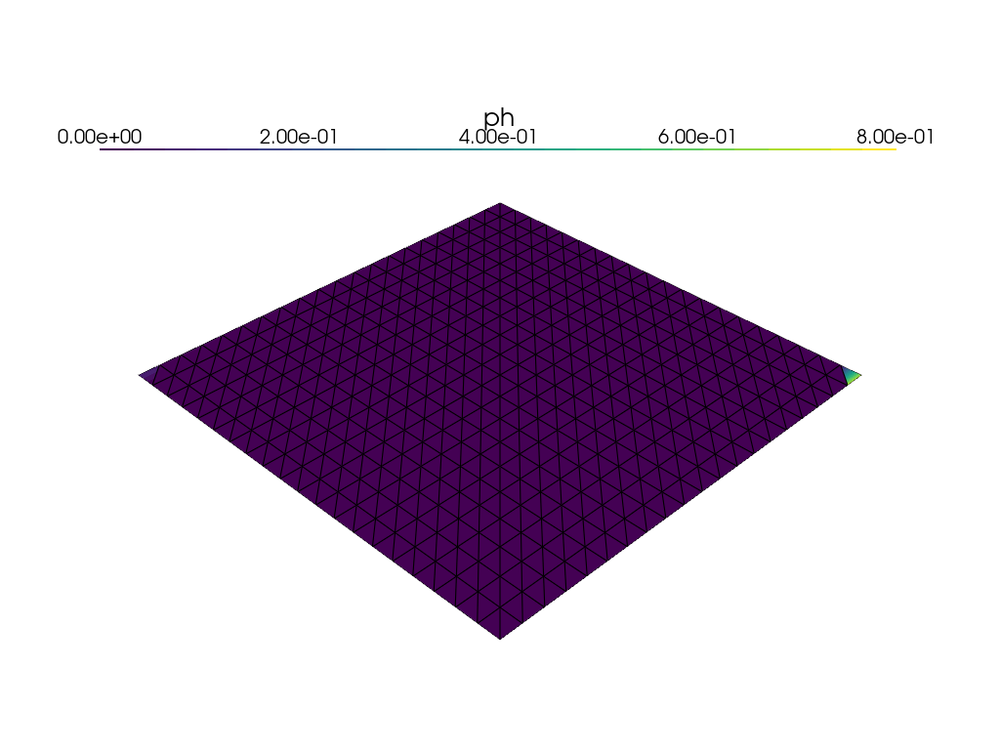

Time 0.41


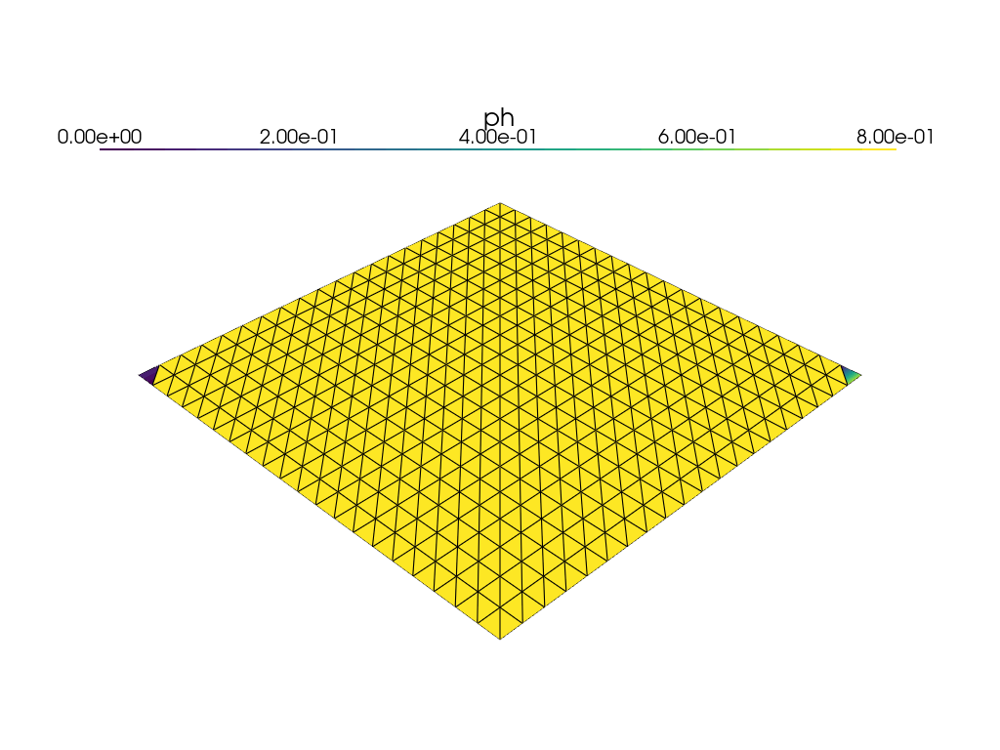

Time 0.46


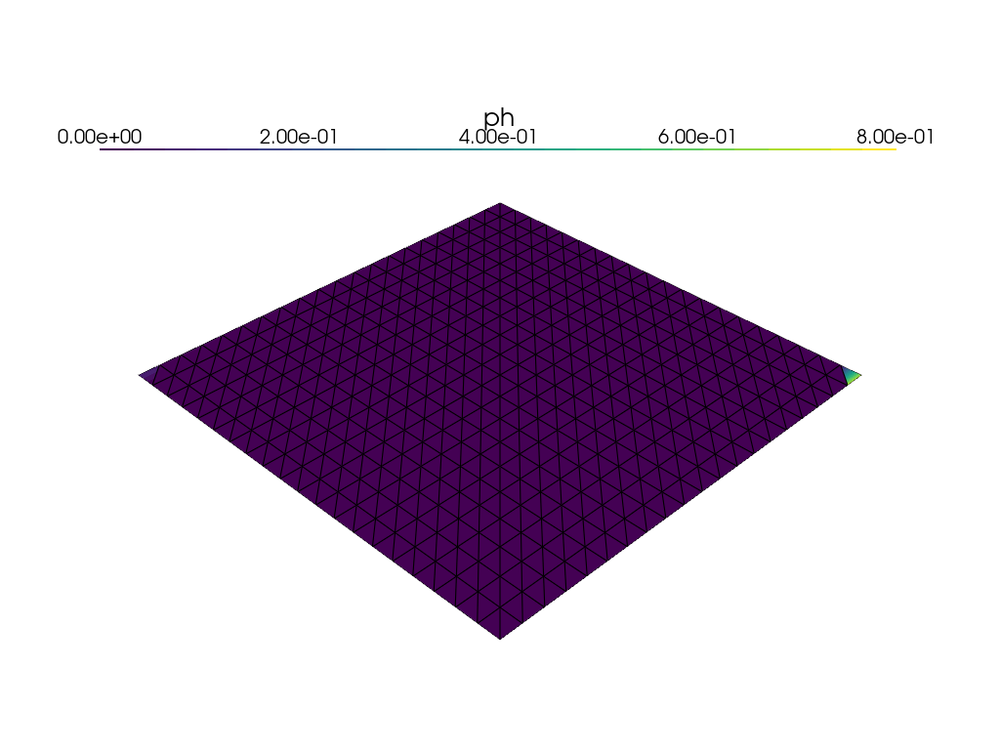

Time 0.51


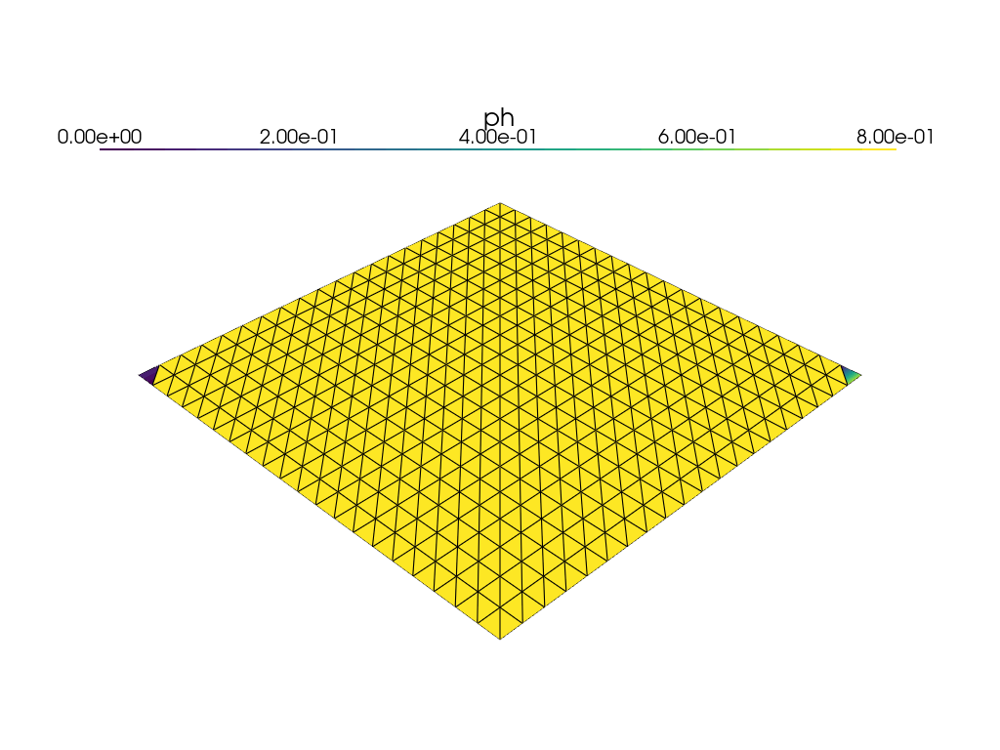

Time 0.56


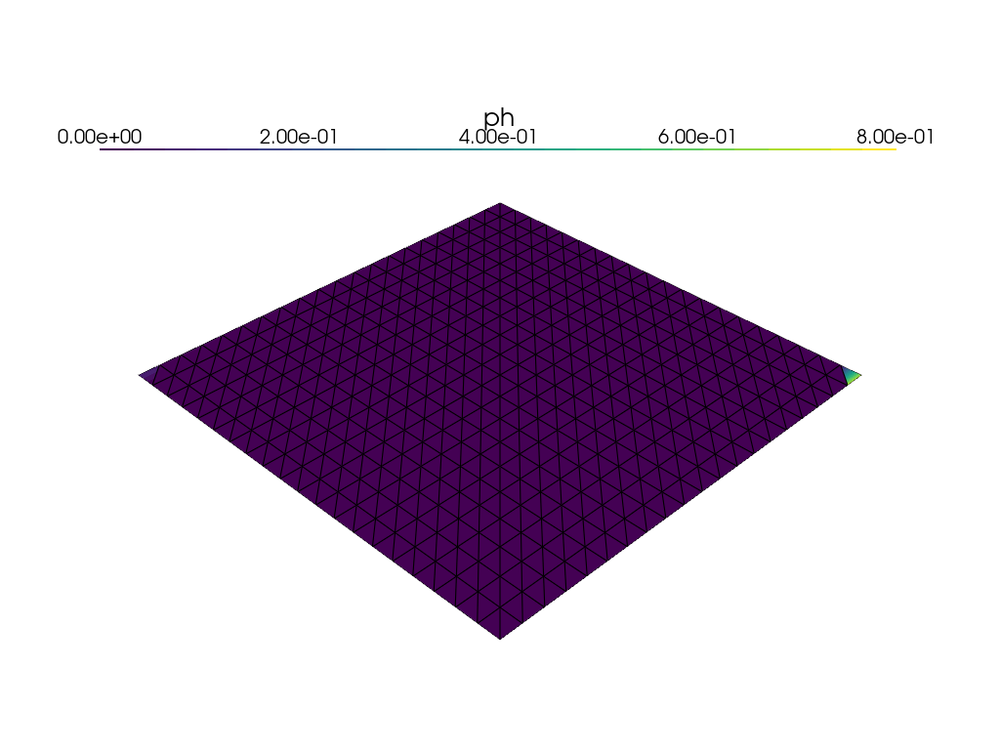

Time 0.61


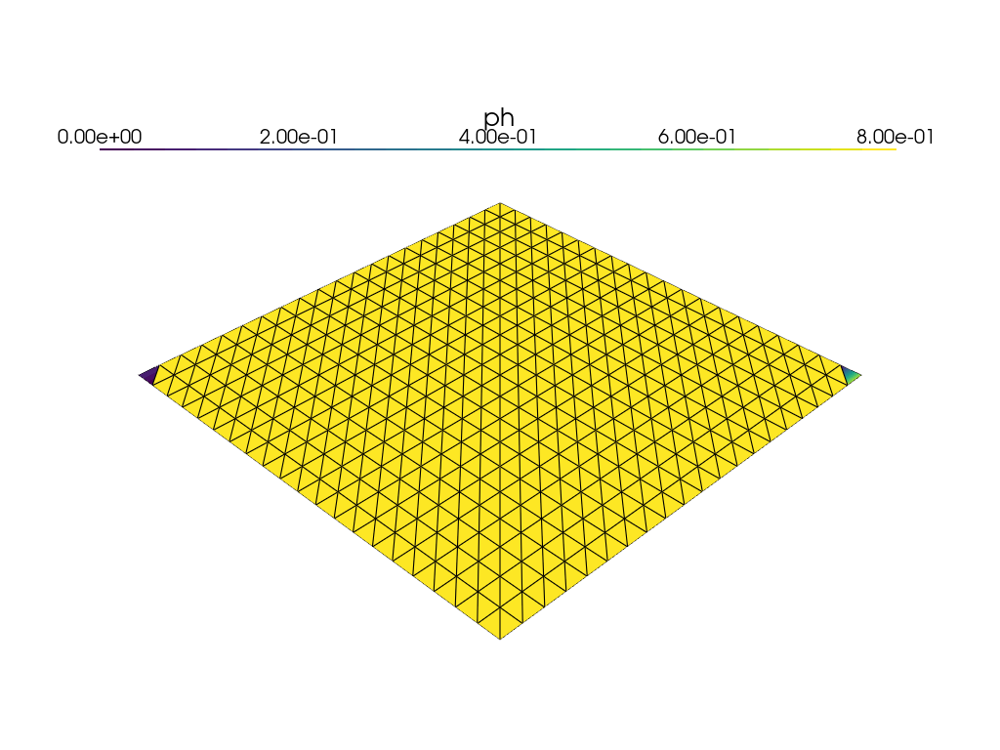

Time 0.66


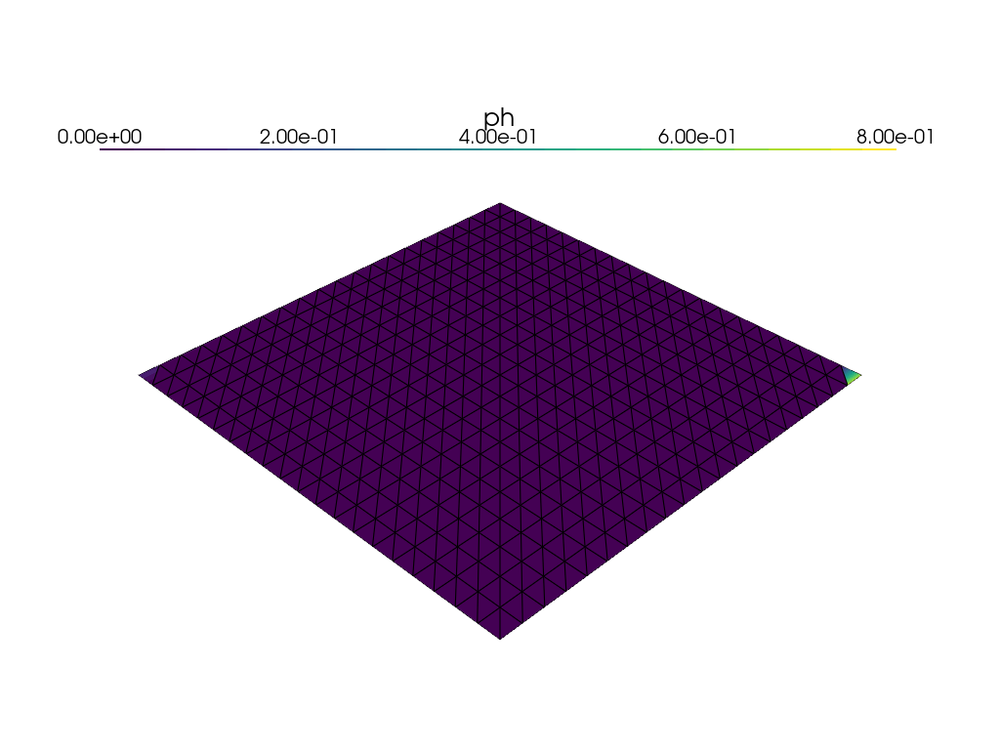

Time 0.71


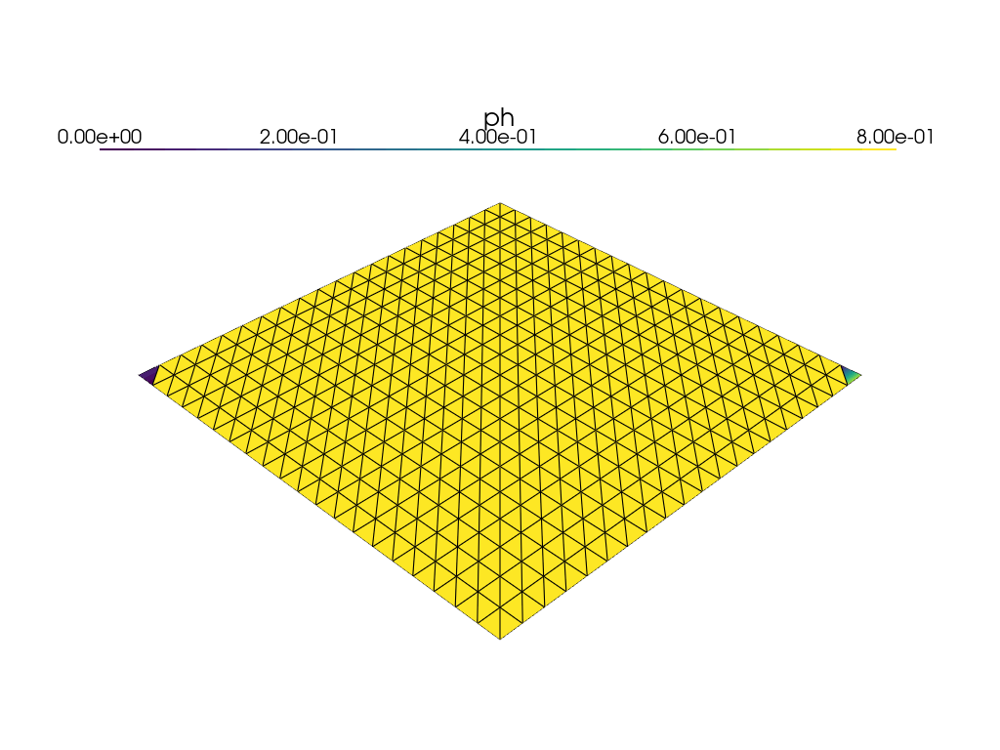

Time 0.76


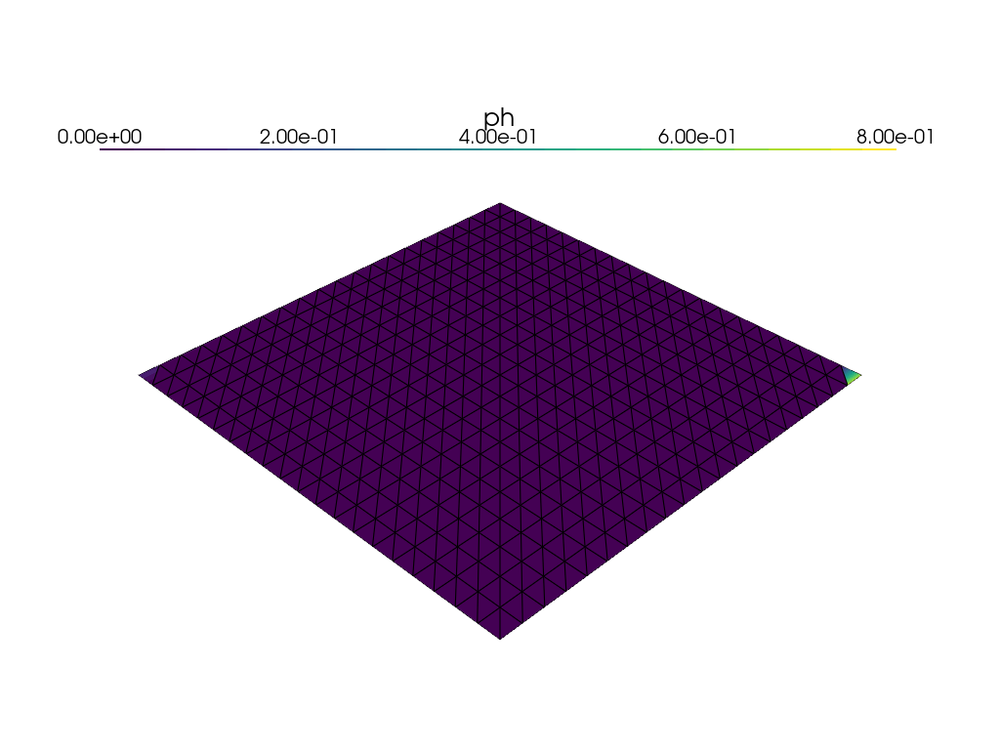

Time 0.81


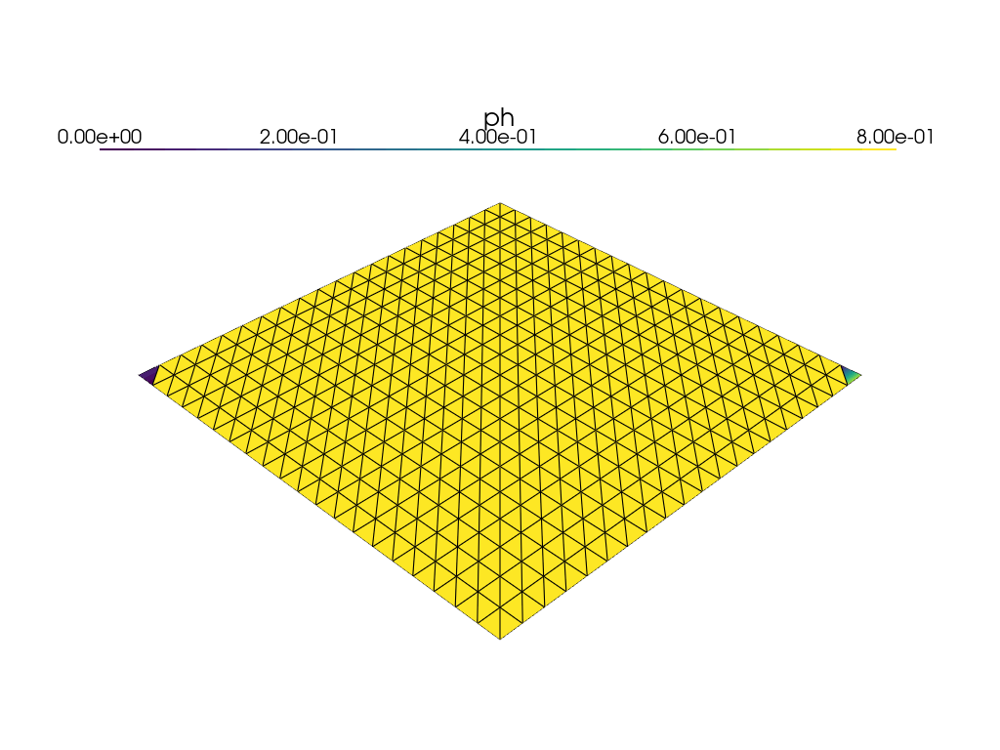

Time 0.86


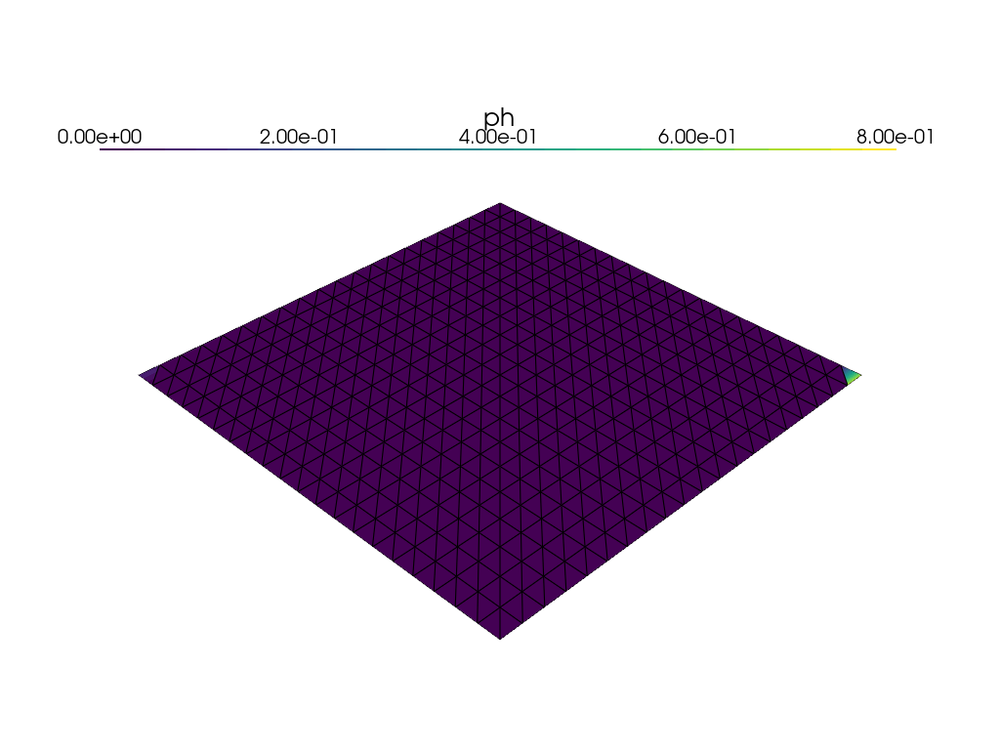

Time 0.91


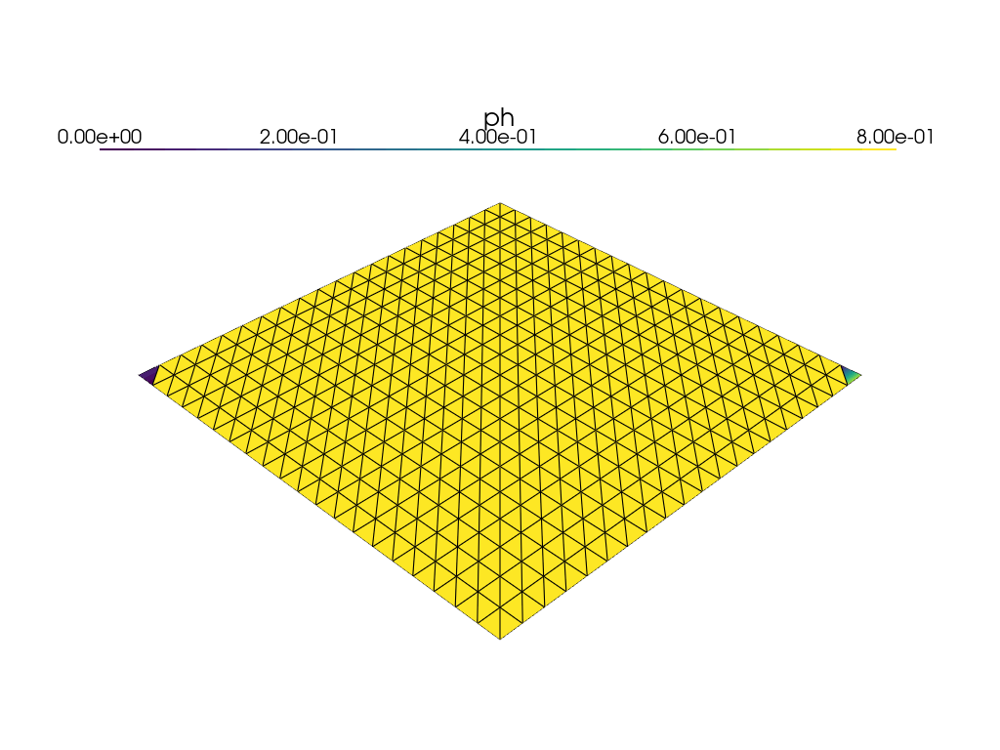

Time 0.96


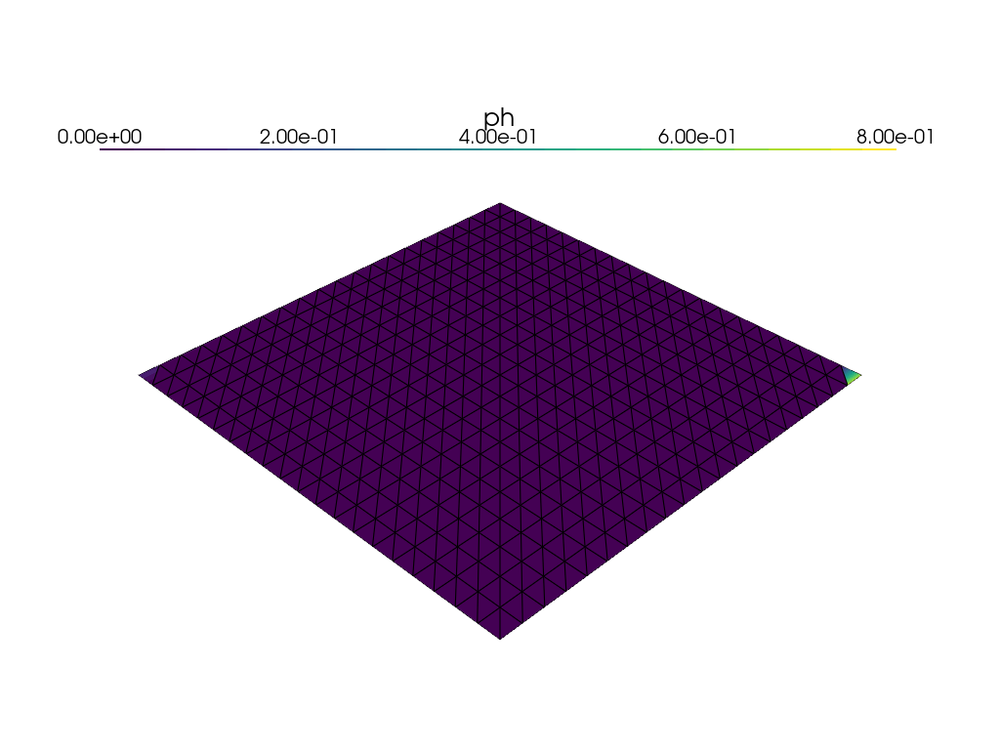

Time 1.01


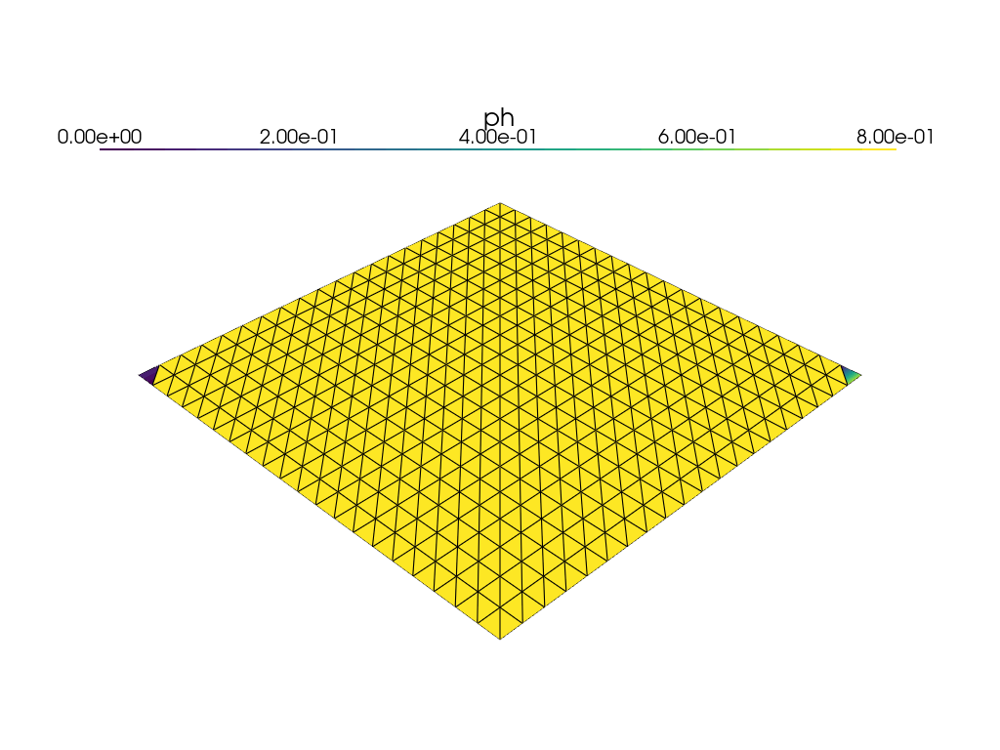

Time 1.06


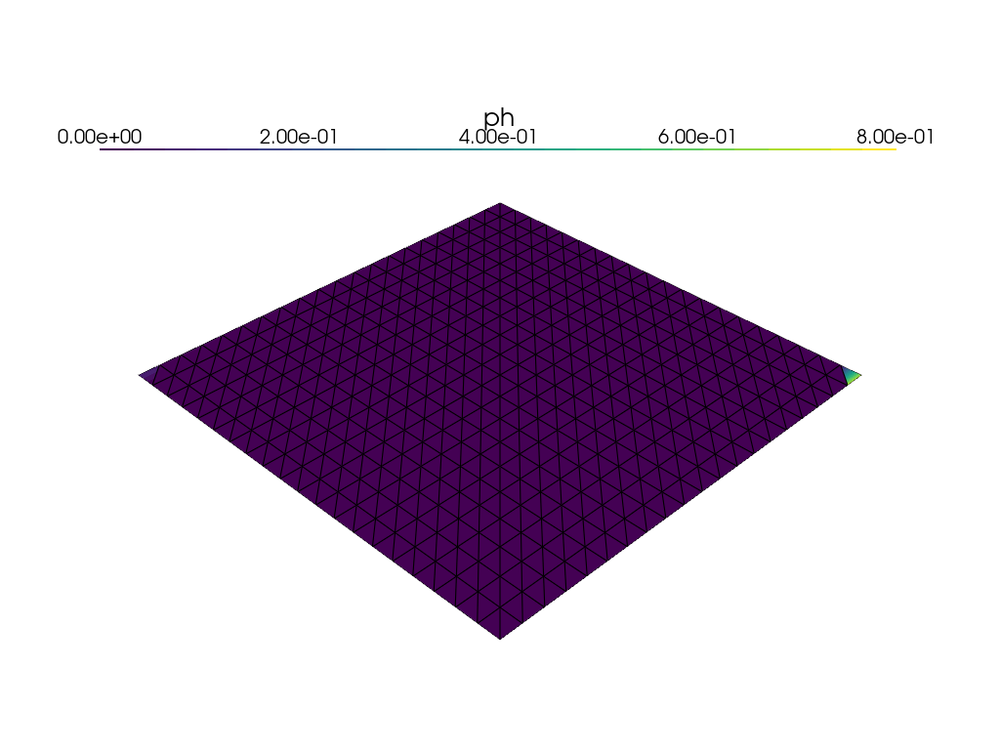

Time 1.11


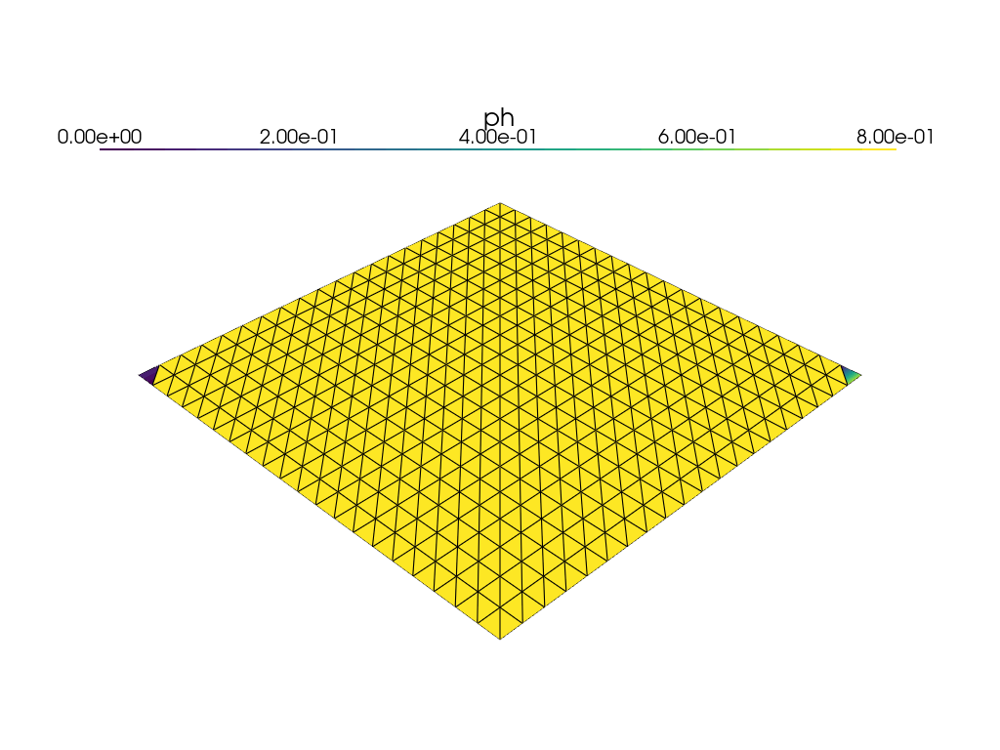

Time 1.16


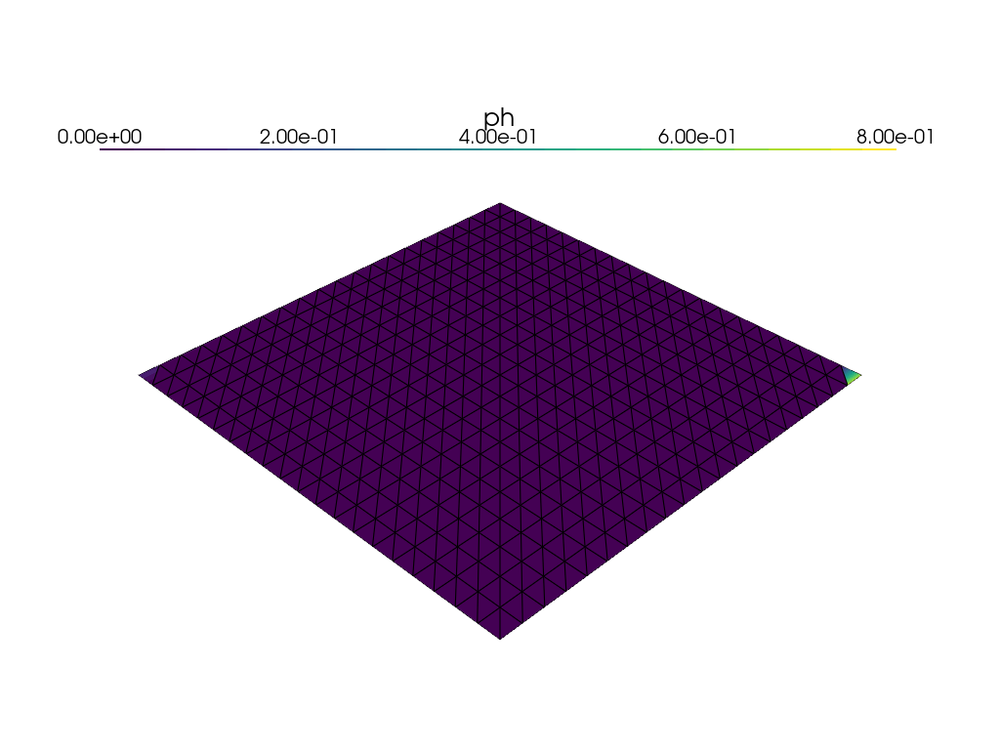

Time 1.21


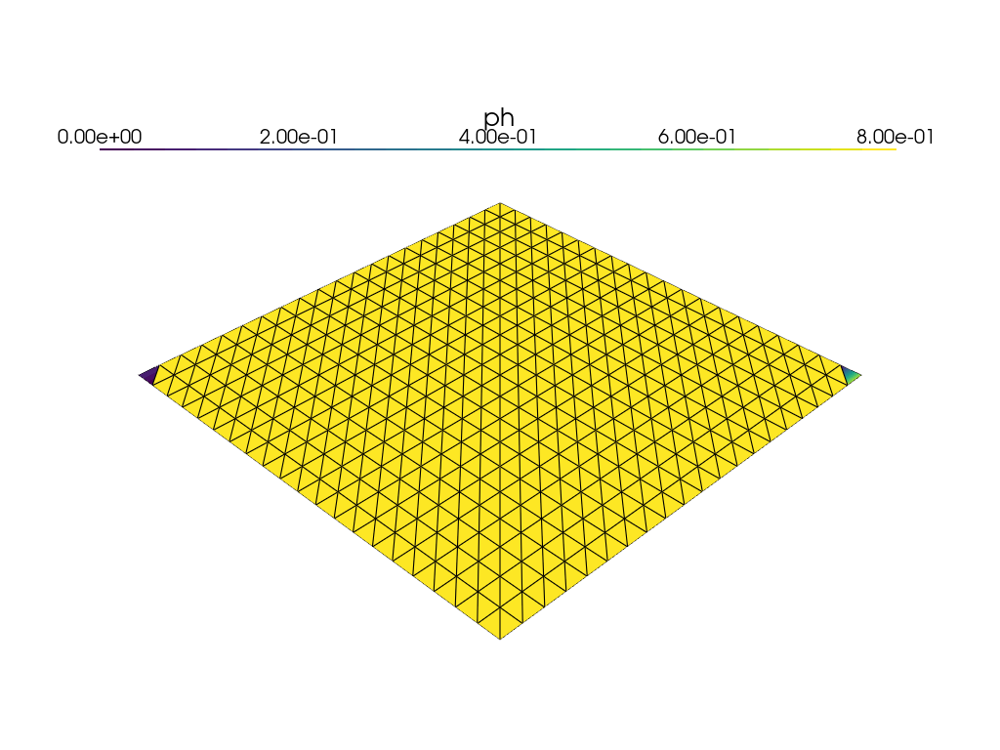

Time 1.26


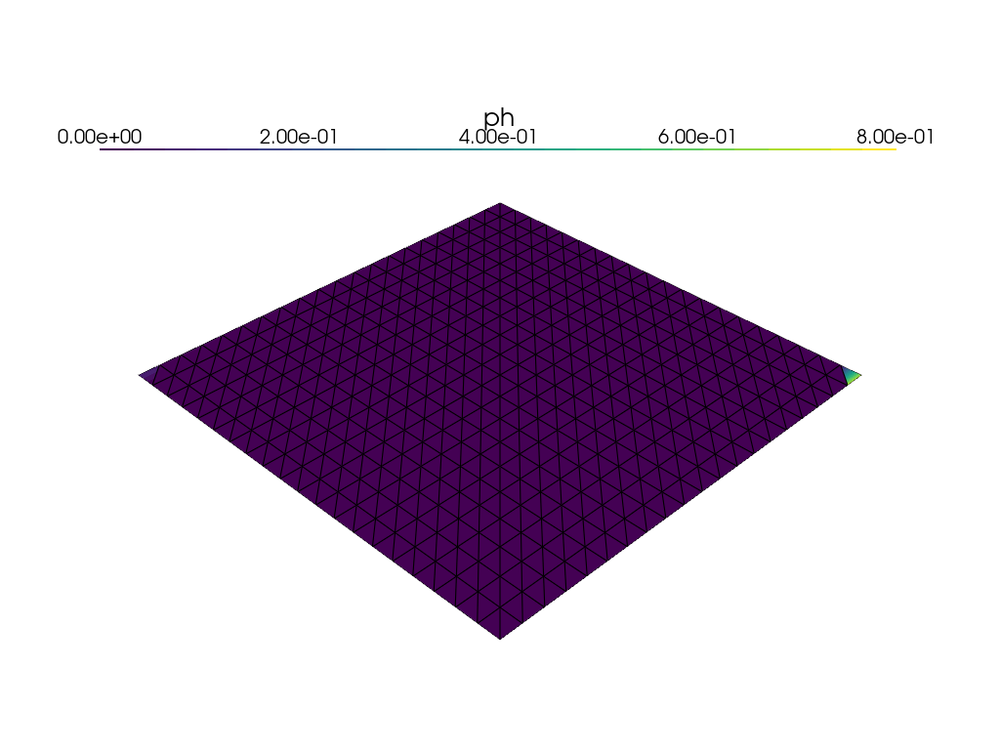

Time 1.31


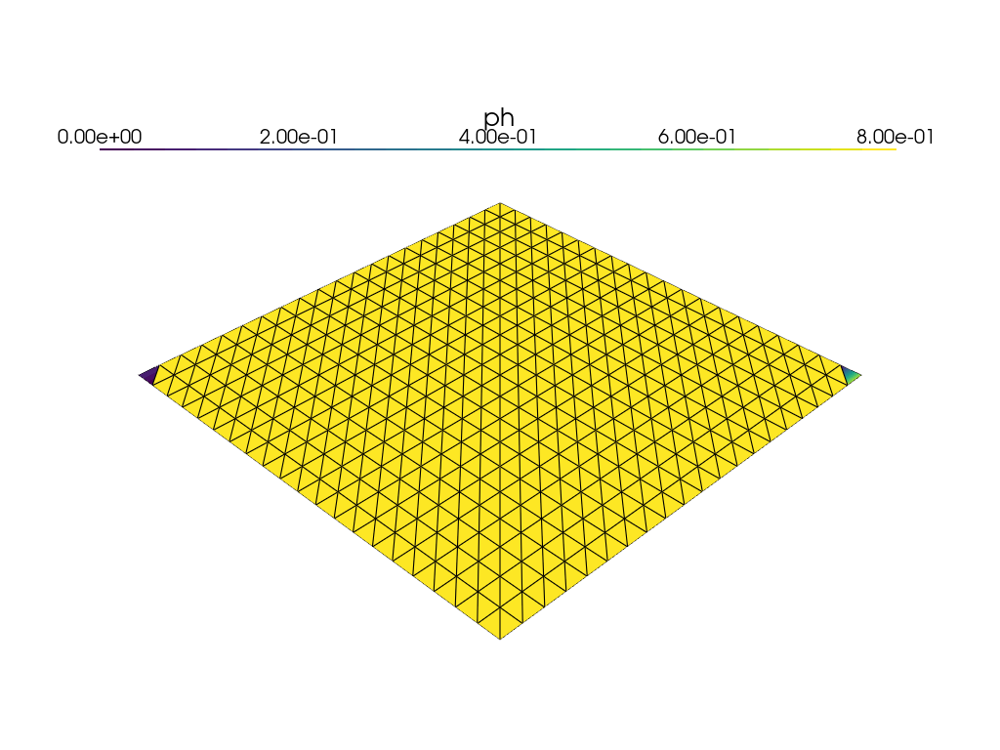

Time 1.36


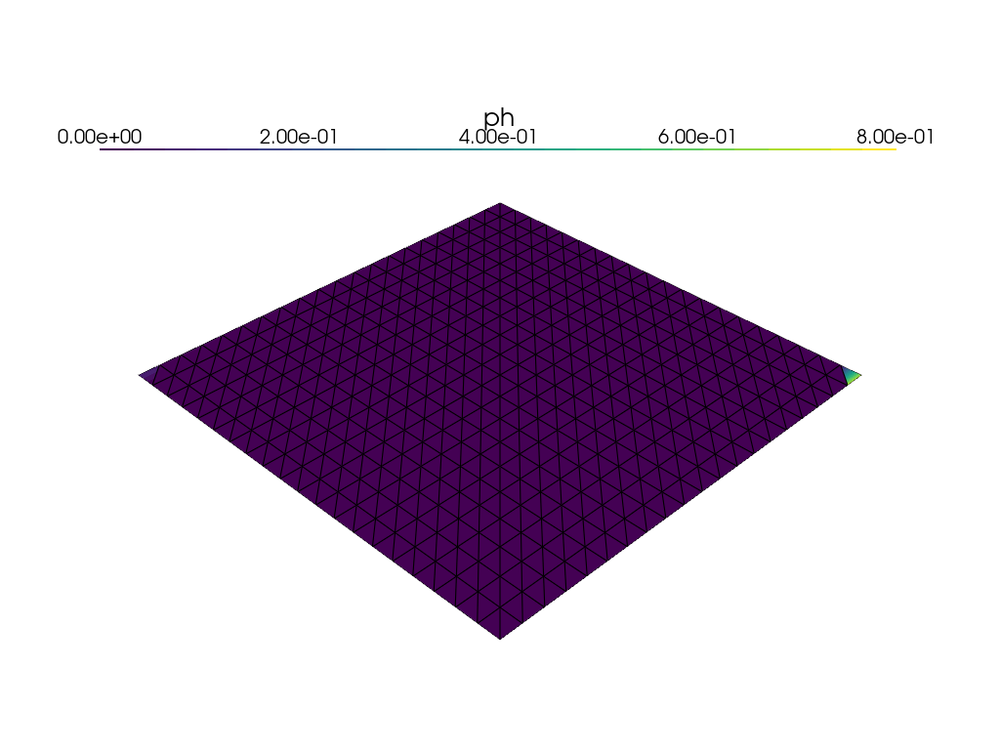

Time 1.41


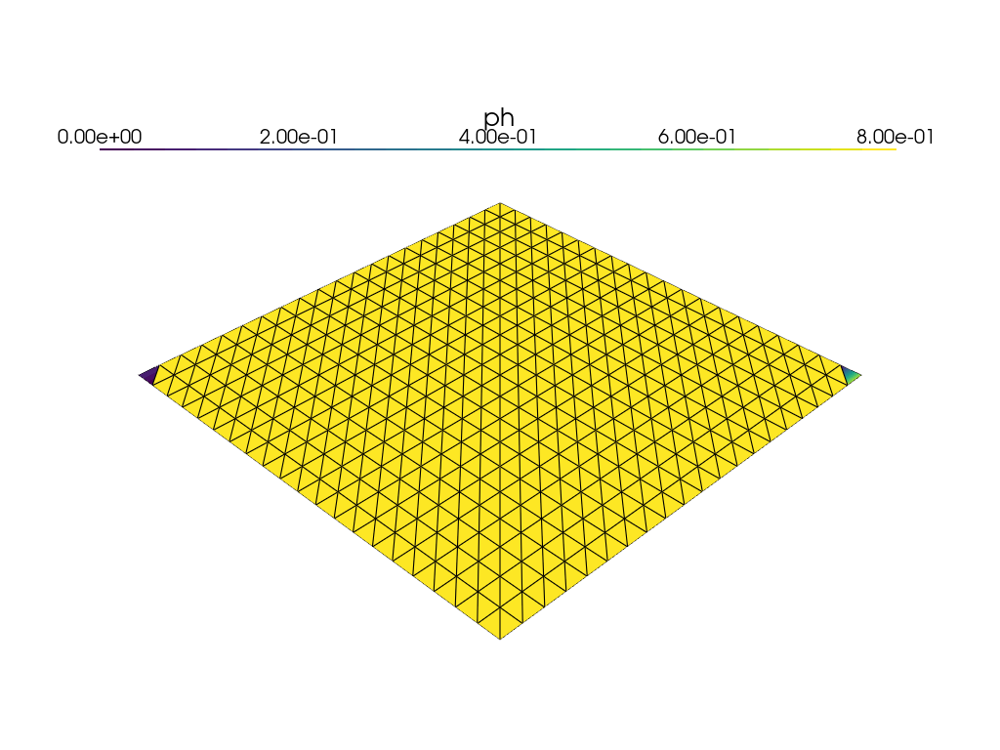

Time 1.46


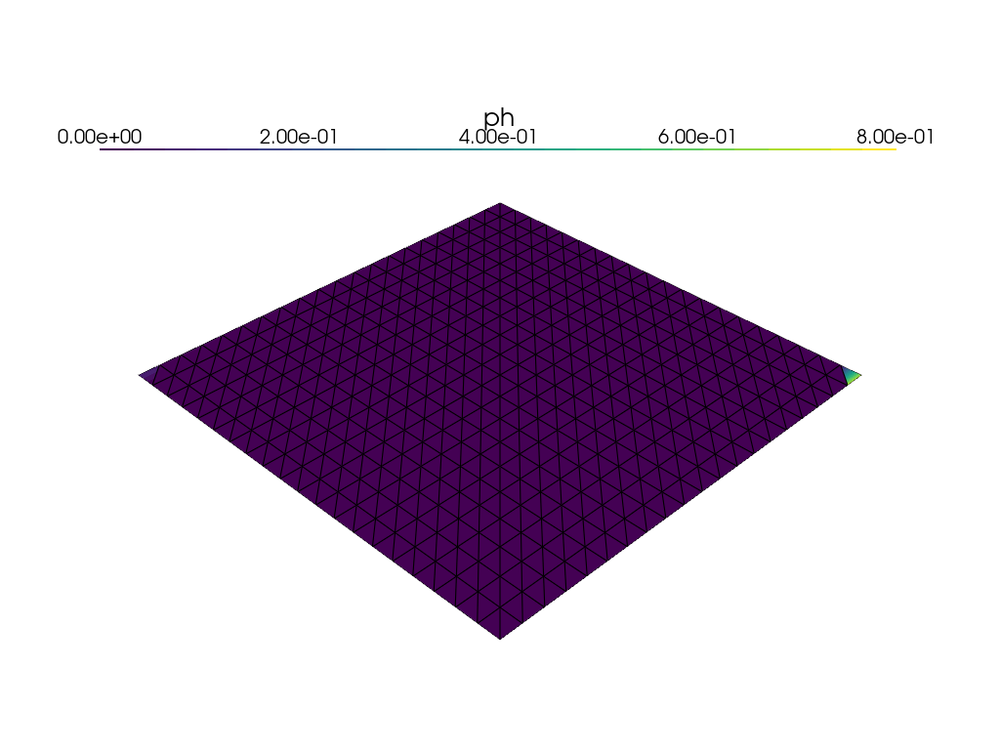

KeyboardInterrupt: 

In [ ]:
Pv=[]
Vv=[]
for i in range(num_steps):
    # Update current time step
    t += dt

    # Step 1: Tentative veolcity step
    with b1.localForm() as loc_1:
        loc_1.set(0)
    dolfinx.fem.petsc.assemble_vector(b1, L1)
    dolfinx.fem.petsc.apply_lifting(b1, [a1], [pressure_boundary_conditions])
    b1.ghostUpdate(addv=PETSc.InsertMode.ADD_VALUES, mode=PETSc.ScatterMode.REVERSE)
    dolfinx.fem.petsc.set_bc(b1, pressure_boundary_conditions)
    solver1.solve(b1, ph.x.petsc_vec)
    ph.x.scatter_forward()

#    Pv.append(p_n.eval(domain.geometry.x,np.arange(121)))
#    Vv.append(u_n.eval(domain.geometry.x,np.arange(121)))

    # Write solutions to file
    vtx_p.write(t)

    p_n.x.array[:] = ph.x.array

    #new_warped = grid.warp_by_scalar("ph", factor=0.2)
    #warped.points[:, :] = new_warped.points
    #warped.point_data["ph"][:] = ph.x.array
    #plotter.write_frame()

    #new_warped = grid.warp_by_scalar("ph", factor=0.2)
    new_grid = pyvista.UnstructuredGrid(*plot.vtk_mesh(P))
    grid.points[:, :] = new_grid.points
    grid.point_data["ph"][:] = ph.x.array
    plotter.write_frame()
    

    # Compute error at current time-step
    #error_L2 = np.sqrt(domain.comm.allreduce(dolfinx.fem.assemble_scalar(L2_error), op=MPI.SUM))
    #error_max = domain.comm.allreduce(np.max(u_.x.petsc_vec.array - u_ex.x.petsc_vec.array), op=MPI.MAX)
    # Print error only every 20th step and at the last step
    if (i % 1 == 0) or (i == num_steps - 1):
        #print(f"Time {t:.2f}, L2-error {error_L2:.2e}, Max error {error_max:.2e}")
        print(f"Time {t:.2f}")
        plotter.show()
# Close xmdf file
#plotter.close()
vtx_p.close()
b1.destroy()
solver1.destroy()

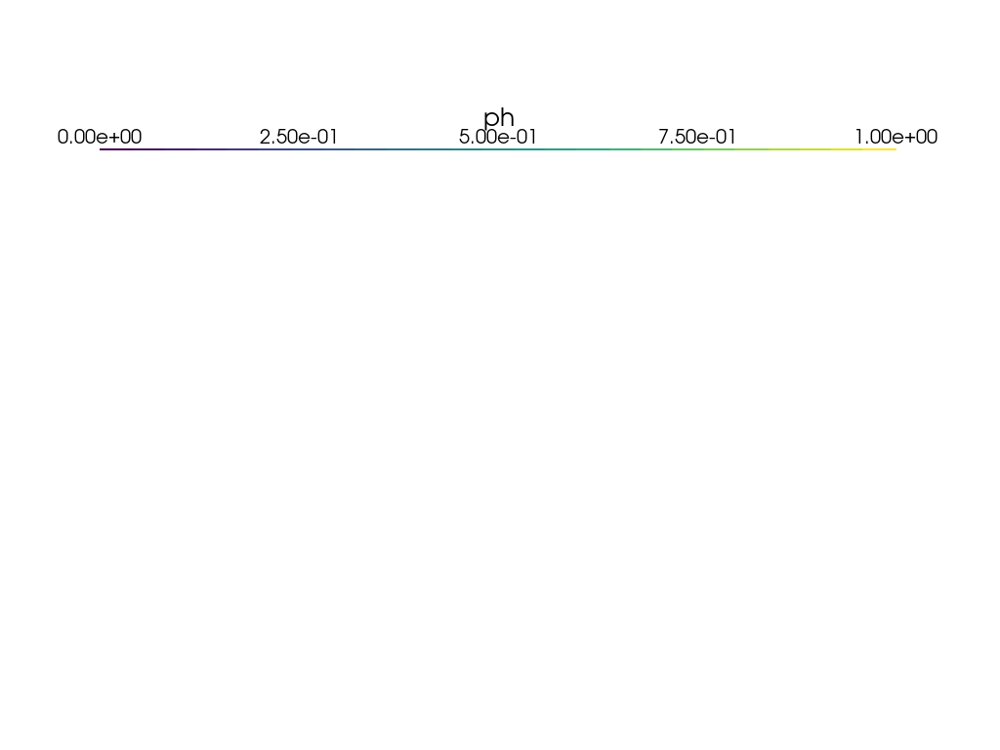

In [ ]:
plotter.show()

In [18]:
import numpy as np
from PIL import Image

#imgs = np.random.randint(0, 255, (100, 50, 50, 3), dtype=np.uint8)
imgs = [Image.fromarray((pp.reshape(11,11,-1)[:,:,1]*100).astype(np.uint8)) for pp in Vv]
# duration is the number of milliseconds between frames; this is 40 frames per second
imgs[0].save("array.gif", format="GIF", save_all=True, append_images=imgs[1:], duration=100, loop=0)

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


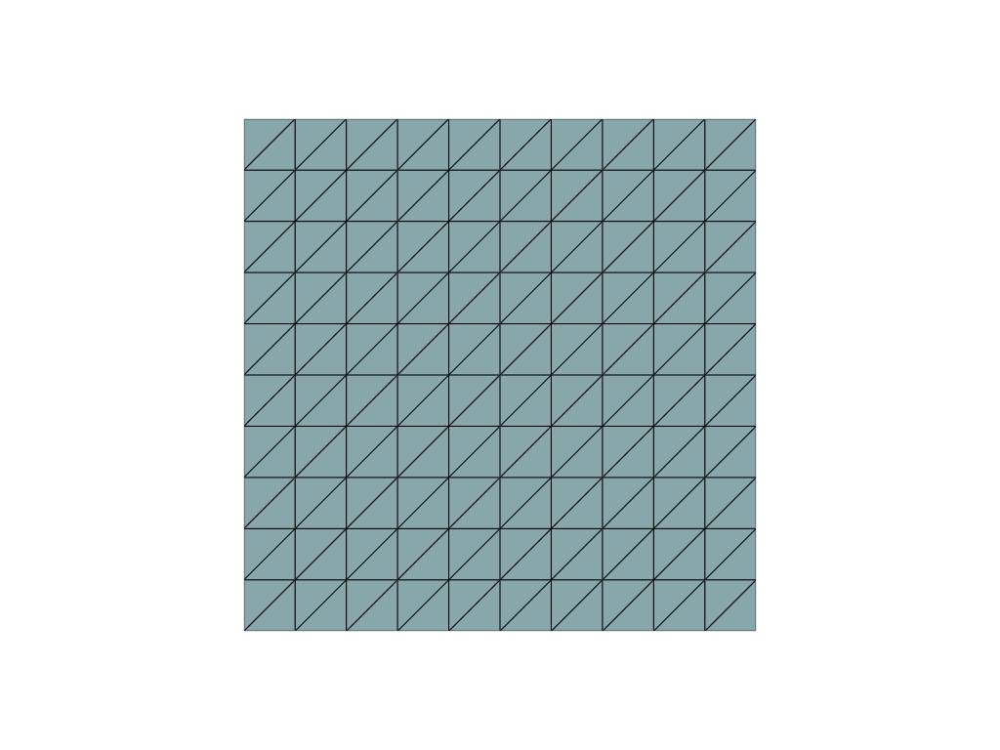

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


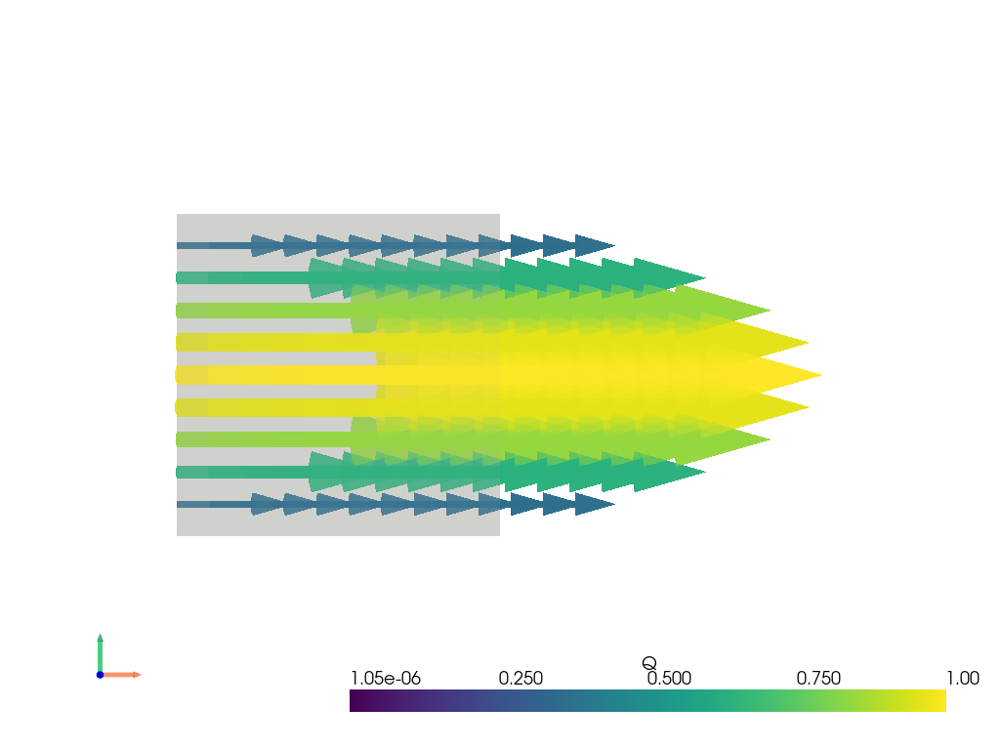

In [32]:
from dolfinx import plot
import pyvista
print(pyvista.global_theme.jupyter_backend)
domain=domain
pyvista.start_xvfb()
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

u_grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)
#P_=np.concatenate((P,np.ones((P.shape[0],1))),axis=1)
#u_grid["P"] = P_
#P=((P-P.min(axis=0))/(P.max(axis=0)-P.min(axis=0)))*0.5
P=Vv[-1]
P_=np.concatenate((P,np.zeros((P.shape[0],1))),axis=1)
u_grid["P"]=P_
u_grid.set_active_vectors("P")

p = pyvista.Plotter()
p.add_mesh(u_grid.arrows, line_width=0.5,lighting=False,opacity=0.9, scalar_bar_args={"title": "Q"})
p.add_mesh(u_grid, color="grey", ambient=0.6, opacity=0.6, show_edges=False)
_ = p.add_axes(line_width=5, labels_off=True)
p.view_xy()

p.show()

static


error: XDG_RUNTIME_DIR is invalid or not set in the environment.


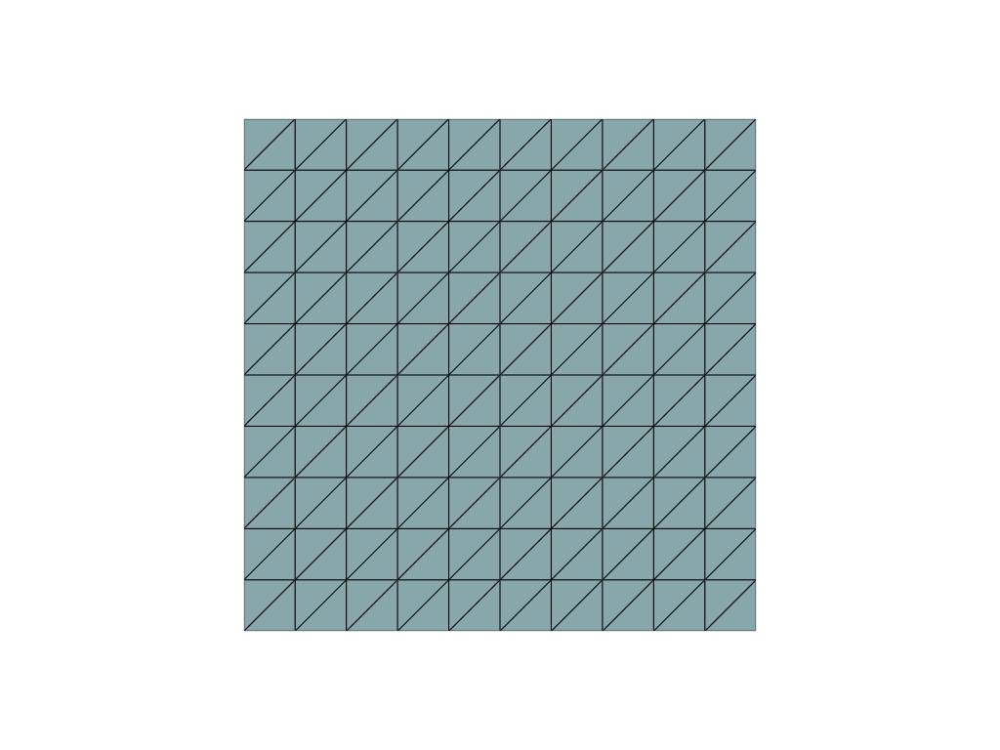

error: XDG_RUNTIME_DIR is invalid or not set in the environment.


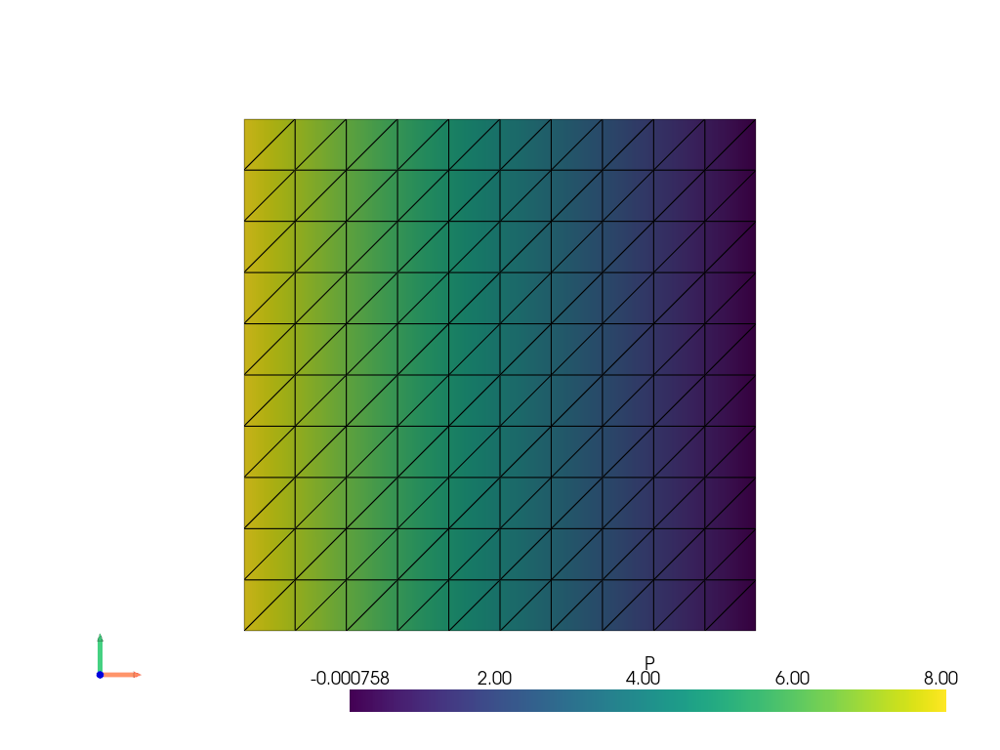

In [38]:
from dolfinx import plot
import pyvista
print(pyvista.global_theme.jupyter_backend)
domain=domain
pyvista.start_xvfb()
tdim = domain.topology.dim
fdim = tdim - 1
domain.topology.create_connectivity(tdim, tdim)
topology, cell_types, geometry = plot.vtk_mesh(domain, tdim)
grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

plotter = pyvista.Plotter()
plotter.add_mesh(grid, show_edges=True)
plotter.view_xy()
if not pyvista.OFF_SCREEN:
    plotter.show()
else:
    figure = plotter.screenshot("fundamentals_mesh.png")

u_grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)
#P_=np.concatenate((P,np.ones((P.shape[0],1))),axis=1)
#u_grid["P"] = P_
#P=((P-P.min(axis=0))/(P.max(axis=0)-P.min(axis=0)))*0.5
#P=Pv[-1]
#P_=np.concatenate((P,np.zeros((P.shape[0],1))),axis=1)
u_grid.point_data["P"]=Pv[2]
u_grid.set_active_scalars("P")
u_plotter = pyvista.Plotter()
u_plotter.add_mesh(u_grid, show_edges=True)
u_plotter.view_xy()
u_plotter.add_axes(line_width=5, labels_off=True)
if not pyvista.OFF_SCREEN:
    u_plotter.show()

In [32]:
#Vv[0].x.array.shape
Vv[0].evaluate?

Signature: Vv[0].evaluate(x, mapping, component, index_values, derivatives=())
Docstring: Get *self* from *mapping* and return the component asked for.
File:      /dolfinx-env/lib/python3.12/site-packages/ufl/core/terminal.py
Type:      method